In [17]:
import pandas as pd
from dateutil.relativedelta import relativedelta

def load_data(file_path):
    """Loads monthly OHLCV data from a single CSV file.

    Columns: ticker, date, open, high, close, low, volume.
    Pivots into DataFrames with dates as index and tickers as columns.
    Computes monthly returns and typical prices.
    """
    df = pd.read_csv(file_path)
    df['date'] = pd.to_datetime(df['date'])
    df = df.sort_values(['ticker', 'date'])

    closes = df.pivot(index='date', columns='ticker', values='close')
    highs = df.pivot(index='date', columns='ticker', values='high')
    lows = df.pivot(index='date', columns='ticker', values='low')
    volumes = df.pivot(index='date', columns='ticker', values='volume')

    returns_df = closes.pct_change().dropna(how='all')
    tp_df = (highs + lows + closes) / 3
    vol_df = volumes.dropna(how='all')

    return returns_df, tp_df, vol_df

In [18]:
from datetime import timedelta
from dateutil.relativedelta import relativedelta

def select_top_vwap(tp_df, vol_df, date, prior_months=1):
    """Selects top 50 stocks by VWAP over the prior month.

    Computes VWAP = (typical_price * volume) / (volume) for each stock.
    Uses relativedelta for monthly offsets.
    """
    start_date = date - relativedelta(months=prior_months)
    prior_tp = tp_df.loc[start_date:date-relativedelta(days=1)]
    prior_vol = vol_df.loc[start_date:date-relativedelta(days=1)]
    prior_tp, prior_vol = prior_tp.align(prior_vol, join='inner')
    vwap = (prior_tp * prior_vol) / prior_vol
    vwap = vwap.dropna()
    top_50 = vwap.mean().nlargest(50).index
    return top_50

In [19]:
import numpy as np
from dateutil.relativedelta import relativedelta

def compute_correlations(returns_df, stocks, event_date, window_months):
    """Computes pairwise pearson correlations over a window *prior* to the event_date.

    Returns correlation matrix and the period returns data for bootstrapping.
    """
    # The correlation window should end the day before the event_date
    corr_end_date = event_date - relativedelta(days=1)
    # The correlation window starts 'window_months' before the end date
    corr_start_date = corr_end_date - relativedelta(months=window_months)

    # Ensure the slice includes the correct dates for the pre-event window
    period_returns = returns_df.loc[corr_start_date:corr_end_date, stocks].dropna(how='all', axis=1)
    corr_matrix = period_returns.corr(method='pearson')
    return corr_matrix, period_returns

In [20]:
import networkx as nx
import numpy as np

def build_spanning_trees(corr_matrix, tree_type='min'):
    """Builds min or max spanning tree using NetworkX.
    tree_type: 'min' for MST, 'max' for max ST.
    """
    if tree_type == 'min':
        dist_matrix = 1 - corr_matrix
        G = nx.from_pandas_adjacency(dist_matrix)
        st = nx.minimum_spanning_tree(G, ignore_nan=True)
    elif tree_type == 'max':
        simi_matrix = 1 + corr_matrix.clip(lower=0)
        G = nx.from_pandas_adjacency(simi_matrix)
        st = nx.maximum_spanning_tree(G, ignore_nan=True)
    return st

In [21]:
def detect_clusters(st):
    """Detects clusters using Louvain and computes modularity.

    Returns clusters and Q score.
    """
    communities = nx.community.louvain_communities(st)
    partition = {node: i for i, comm in enumerate(communities) for node in comm}
    Q = nx.community.modularity(st, communities)
    return communities, Q

In [22]:
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np

def plot_clusters_detected(st, save_path='/content/clusters.png'):
    """Plots the detected clusters in the spanning tree.
    Each cluster is colored differently.
    """
    # Assuming detect_clusters is available in the global scope or imported
    communities, Q = detect_clusters(st)

    if not st.nodes():
        print("Graph has no nodes to plot.")
        return

    # Assign a color to each community
    num_communities = len(communities)
    if num_communities > 0:
        # Create a mapping from node to community index for coloring
        node_community_map = {}
        for i, comm in enumerate(communities):
            for node in comm:
                node_community_map[node] = i

        # Get a colormap, ensure enough distinct colors for communities
        cmap = plt.cm.get_cmap('viridis', num_communities)
        node_colors = [cmap(node_community_map.get(node, 0)) for node in st.nodes()]
    else:
        node_colors = ['blue'] * len(st.nodes()) # Default color if no communities detected

    plt.figure(figsize=(12, 10))
    pos = nx.spring_layout(st, seed=42) # For reproducible layout

    nx.draw_networkx_nodes(st, pos, node_color=node_colors, node_size=700)
    nx.draw_networkx_edges(st, pos, alpha=0.5, edge_color='gray')
    nx.draw_networkx_labels(st, pos, font_size=8, font_color='black')

    plt.title(f"Detected Clusters (Q-score: {Q:.4f})")
    plt.axis('off') # Hide axes
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()

In [23]:
def form_portfolios(returns_df, clusters, lookback_months, post_period_months, event_date, shock_type):
    """Forms long-short momentum portfolios within clusters.

    For easing (shock_type='easing'), long winners in max tree clusters.
    For tightening, short in min tree clusters.
    Uses relativedelta for monthly offsets.
    """
    start_lookback = event_date - relativedelta(months=lookback_months)
    mom = returns_df.loc[start_lookback:event_date].sum().dropna()
    post_start = event_date + relativedelta(days=1)
    post_end = post_start + relativedelta(months=post_period_months)
    post_returns = returns_df.loc[post_start:post_end]

    portfolio_returns = pd.Series(0, index=post_returns.index)
    for cluster in clusters:
        cluster_stocks = list(cluster)
        cluster_mom = mom.reindex(cluster_stocks).dropna()
        if len(cluster_mom) < 2:
            continue
        winners = cluster_mom.nlargest(len(cluster_mom)//3).index
        losers = cluster_mom.nsmallest(len(cluster_mom)//3).index
        if shock_type == 'easing':
            cluster_ret = post_returns[winners].mean(axis=1) - post_returns[losers].mean(axis=1)
        else:  # tightening
            cluster_ret = post_returns[losers].mean(axis=1) - post_returns[winners].mean(axis=1)  # Short winners
        portfolio_returns += cluster_ret / len(clusters)  # Equal weight clusters
    return portfolio_returns

In [24]:
def apply_tx_costs(returns, tx_cost=0.0001, turnover=0.5):
    """Applies transaction costs assuming turnover rate 0.5.

    Adjusted return = return - tx_cost * turnover
    """
    return returns - tx_cost * turnover

In [25]:
def naive_momentum(returns_df, stocks, event_date, post_period_months=12):
    """Naïve benchmark using MA crossovers.

    With monthly data, rolling windows approximate months.
    """
    post_start = event_date + relativedelta(days=1)
    post_end = post_start + relativedelta(months=post_period_months)
    post_returns = returns_df.loc[post_start:post_end, stocks]
    # Simple MA crossover: short MA (2 periods) > long MA (4 periods) buy, else sell (adjusted for monthly)
    short_ma = post_returns.rolling(2).mean()
    long_ma = post_returns.rolling(4).mean()
    signals = np.sign(short_ma - long_ma).shift(1)  # Lag signal
    naive_ret = (post_returns * signals).mean(axis=1)  # Equal weight
    return naive_ret

In [26]:
import matplotlib.pyplot as plt
import pandas as pd

plt.rcParams['font.family'] = 'serif'

def plot_cumulative_returns(port_ret, port_ret_tc, naive_ret, naive_ret_tc, event_name, save_path='/content/'):
    """Plots cumulative returns for long-short vs. naïve.

    Rebases each series to start at 1.
    """
    fig, ax = plt.subplots(figsize=(10, 6))

    # Function to rebase a series to 1
    def rebase_to_1(series):
        if series.empty:
            return pd.Series([], dtype=float) # Return empty series for empty input

        cumulative_product = (1 + series).cumprod()

        # If the first value of the cumulative product is NaN or 0,
        # we cannot rebase meaningfully. Return the cumulative product as it is
        # (it will likely contain NaNs, since you need 2p to incur a trade on MA, which matplotlib handles) or an empty series.
        if cumulative_product.empty or pd.isna(cumulative_product.iloc[0]) or cumulative_product.iloc[0] == 0:
            return cumulative_product

        return cumulative_product / cumulative_product.iloc[0]

    # Plotting each series after rebasing
    rebase_to_1(port_ret).plot(ax=ax, label='Our Momentum')
    rebase_to_1(port_ret_tc).plot(ax=ax, label='Our Momentum (TC)')
    rebase_to_1(naive_ret).plot(ax=ax, label='Naïve Momentum')
    rebase_to_1(naive_ret_tc).plot(ax=ax, label='Naïve Momentum (TC)')

    ax.set_title(f'Cumulative Returns for {event_name}')
    ax.set_ylabel('Normalized Value (Rebased to 1)')
    ax.legend()
    if save_path:
        fig.savefig(save_path)
    plt.show()

In [27]:
from scipy.stats import norm
import numpy as np

def bootstrap_validation(period_returns, tree_type, n_boots=1000):
    """Bootstraps by resampling time series data to validate tree: rebuild, CI on Q and avg edge weight.

    Returns 95% CI for Q and average edge weight.
    """
    Qs = []
    avg_weights = []
    for _ in range(n_boots):
        boot_data = period_returns.sample(frac=1, replace=True)  # Resample time points
        boot_corr = boot_data.corr(method='pearson')

        # If the bootstrapped correlation matrix is all NaNs, assign 0.0 for Q and avg_weight
        if boot_corr.isnull().all().all() or boot_corr.empty:
            Qs.append(0.0)
            avg_weights.append(0.0)
            continue

        st = build_spanning_trees(boot_corr, tree_type)
        _, Q = detect_clusters(st) # detect_clusters handles empty graphs for Q

        # Check if the spanning tree has any edges before calculating mean weight
        if st.edges():
            avg_weight = np.mean([d['weight'] for u, v, d in st.edges(data=True)])
        else:
            avg_weight = 0.0 # If no edges, average weight is 0

        Qs.append(Q)
        avg_weights.append(avg_weight)

    # Filter out NaNs before calculating percentiles, and handle empty lists
    Qs_filtered = [q for q in Qs if not np.isnan(q)]
    avg_weights_filtered = [w for w in avg_weights if not np.isnan(w)]

    Q_ci = np.percentile(Qs_filtered, [2.5, 97.5]) if Qs_filtered else [np.nan, np.nan]
    weight_ci = np.percentile(avg_weights_filtered, [2.5, 97.5]) if avg_weights_filtered else [np.nan, np.nan]

    return Q_ci, weight_ci

In [28]:
import matplotlib.pyplot as plt

# Plot bootstrapping results Q_ci, weight_ci
def plot_bootstrapping_results(Q_ci, weight_ci, save_path='/content/boots_results.png'):
    """Plots the 95% confidence intervals for Q and average edge weight."""
    labels = ['Q Modularity', 'Average Edge Weight']
    lower_bounds = [Q_ci[0], weight_ci[0]]
    upper_bounds = [Q_ci[1], weight_ci[1]]

    # Calculate central values for plotting (e.g., mid-point of the interval)
    central_values = [(Q_ci[0] + Q_ci[1]) / 2, (weight_ci[0] + weight_ci[1]) / 2]
    # Calculate error bars (distance from central value to bounds)
    errors_lower = [central_values[0] - lower_bounds[0], central_values[1] - lower_bounds[1]]
    errors_upper = [upper_bounds[0] - central_values[0], upper_bounds[1] - central_values[1]]
    errors = [errors_lower, errors_upper]

    fig, ax = plt.subplots(figsize=(12, 8))
    bars = ax.bar(labels, central_values, yerr=errors, capsize=7, color=['darkgreen', 'lightcoral'])

    ax.set_ylabel('Value')
    ax.set_title('Bootstrapping Results: 95% Confidence Intervals')

    # Add text labels for the intervals
    for i, bar in enumerate(bars):
        ax.text(bar.get_x() + bar.get_width() / 2,
                bar.get_height() + errors_upper[i] + (max(central_values) * 0.03), # Position text slightly above error bar
                f'[{lower_bounds[i]:.3f}, {upper_bounds[i]:.3f}]',
                ha='center', va='bottom', fontsize=9)

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path)
    plt.show()

In [29]:
import numpy as np

def calc_annual_pnl(ret_series, num_months):
    """Calculates annualized PNL assuming starts with $1.

    Total PNL = cumprod(1 + ret) - 1, then annualize = (1 + total)^{12/num_months} - 1.
    Handles empty series.
    """
    if ret_series.empty:
        return np.nan
    cum_ret = (1 + ret_series).cumprod().iloc[-1] - 1
    annual_pnl = (1 + cum_ret) ** (12 / num_months) - 1 if num_months > 0 else cum_ret
    return annual_pnl

In [30]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_annual_pnl(results_df, save_path='/content/annual_pnl.png'):
    """Plots heatmap of annual PNL for our vs. naïve across keys.

    Fills NaN with 1.
    """
    pnl_cols = ['our_annual_pnl', 'our_annual_pnl_tc', 'naive_annual_pnl', 'naive_annual_pnl_tc']
    pnl_df = results_df[pnl_cols].fillna(1)  # Fill NaN with 1
    fig, ax = plt.subplots(figsize=(12, 8))
    sns.heatmap(pnl_df.T, annot=False, cmap='coolwarm', ax=ax)
    ax.set_title('Annualized PNL Heatmap')
    if save_path:
        fig.savefig(save_path, bbox_inches='tight')
    plt.show()

In [31]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_cumsum_heatmap(results_df, save_path='/content/cumsum_heatmap.png'):
    """Plots 4x6 heatmap of average cumsum PNL per strategy x event.

    Aggregates mean cum_ret per event, fills NaN with 1.
    4 strategies x 6 events matrix.
    """
    # Extract event from index
    results_df['Event'] = results_df.index.str.split('_').str[0]
    cum_cols = ['our_ret', 'our_ret_tc', 'naive_ret', 'naive_ret_tc']
    agg_df = results_df.groupby('Event')[cum_cols].mean().fillna(1)
    # Before plotting output agg_df to csv
    agg_df.to_csv('/content/event_strat.csv')
    # Plotting
    fig, ax = plt.subplots(figsize=(12, 8))
    sns.heatmap(agg_df.T, annot=False, cmap='viridis', ax=ax)
    ax.set_title('Cumsum PNL Heatmap (Strategies x Events)')
    ax.set_ylabel('Strategy')
    ax.set_xlabel('Event')
    if save_path:
        fig.savefig(save_path, bbox_inches='tight')
    plt.show()

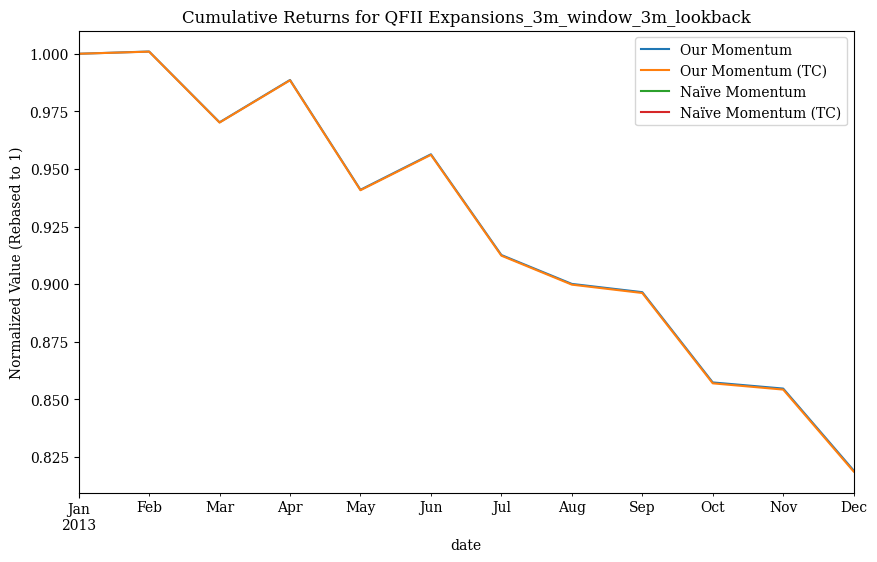

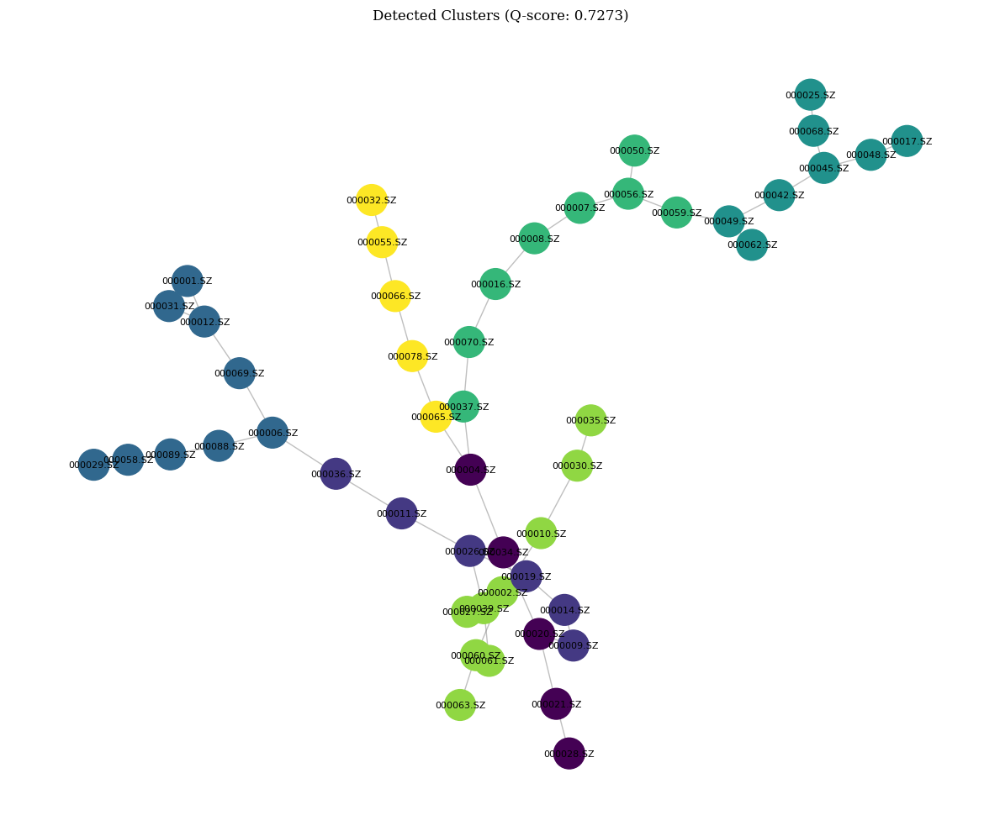

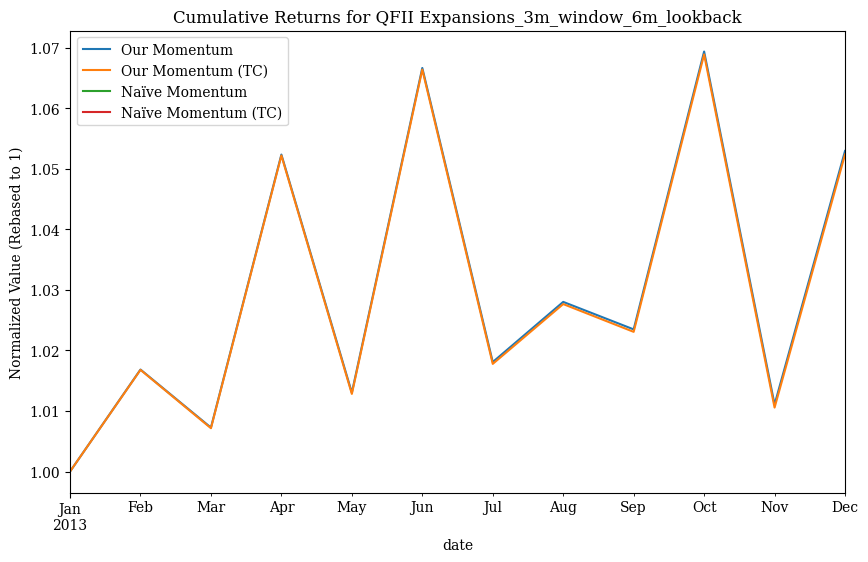

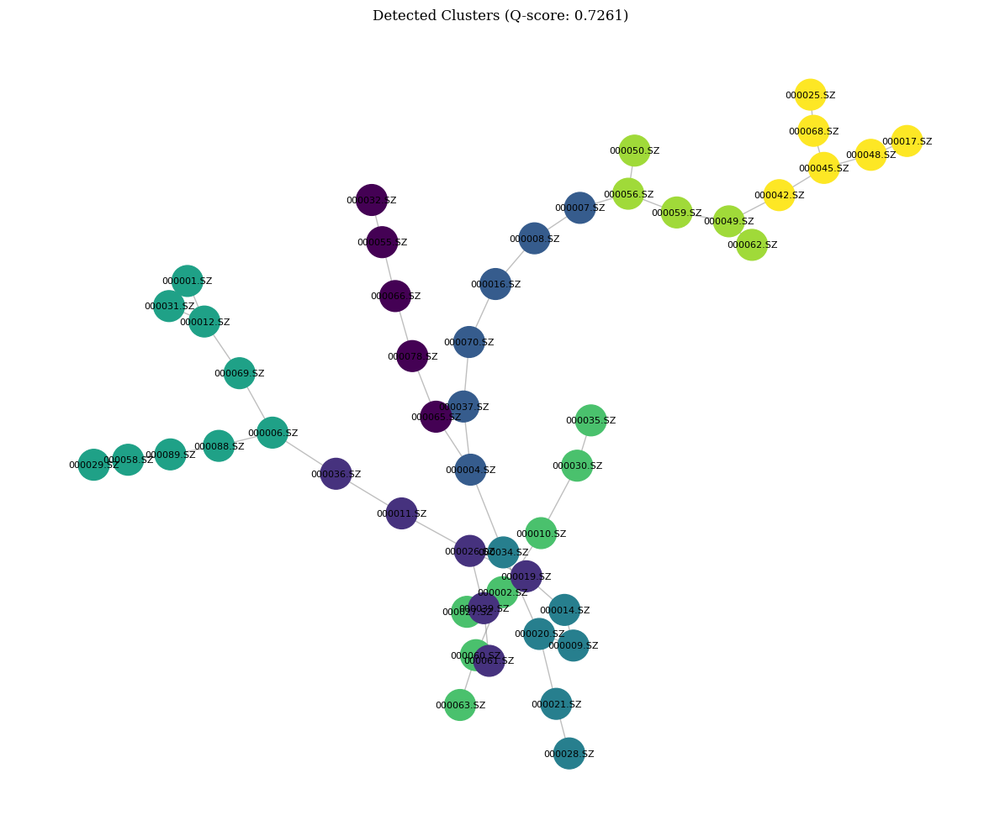

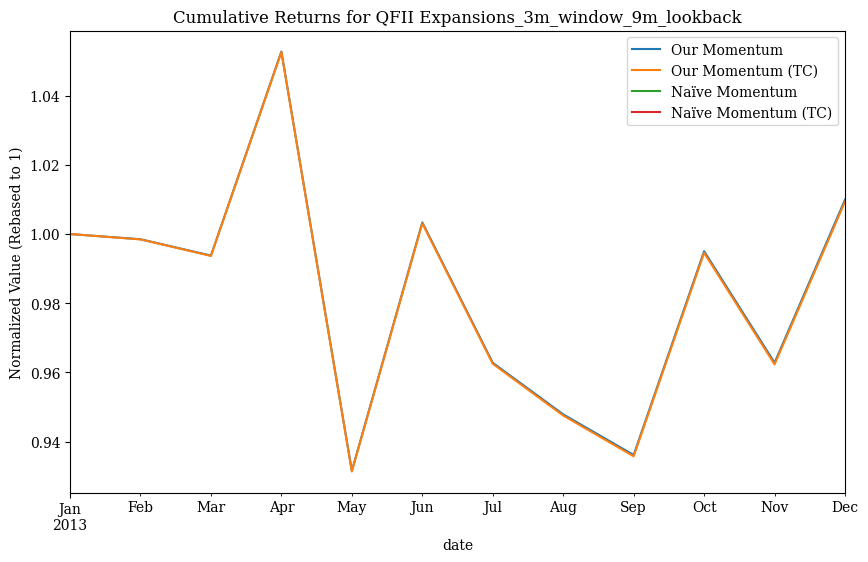

...

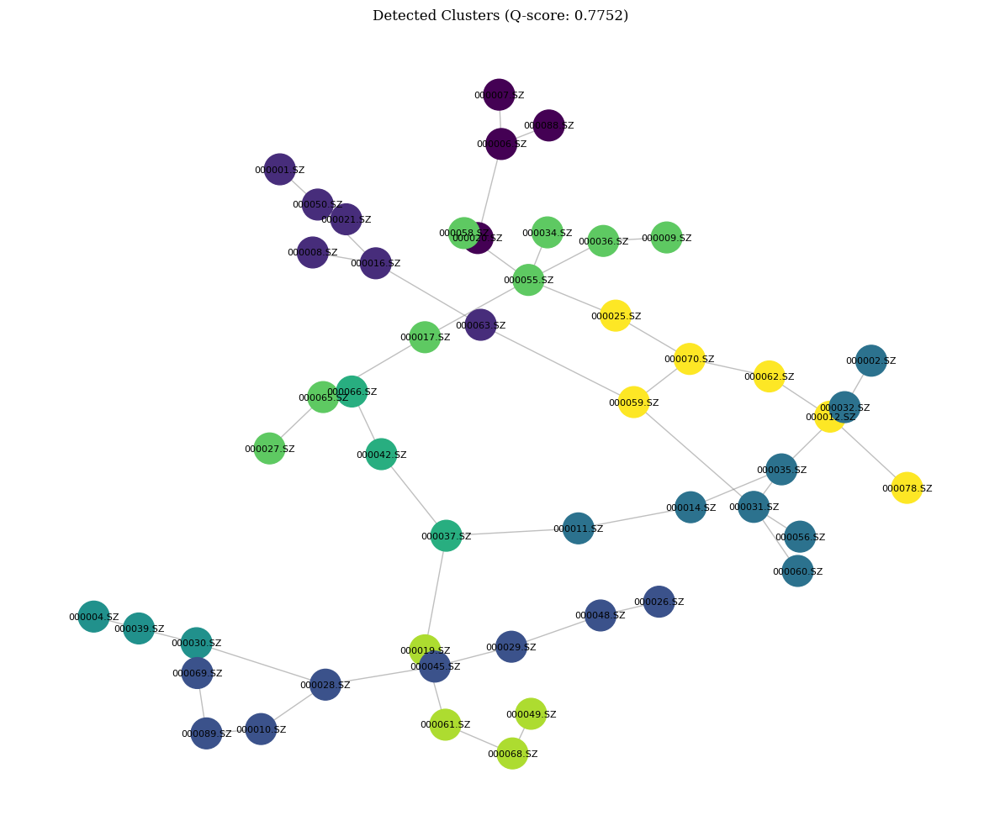

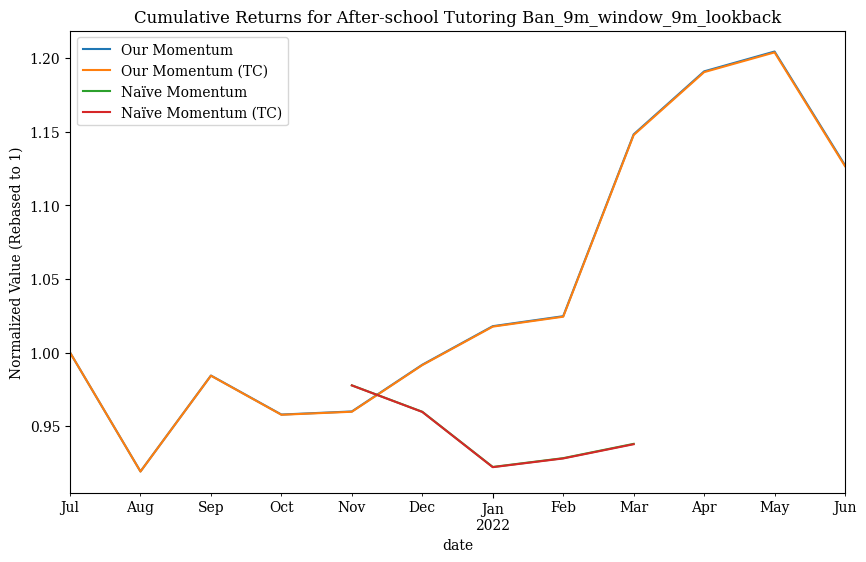

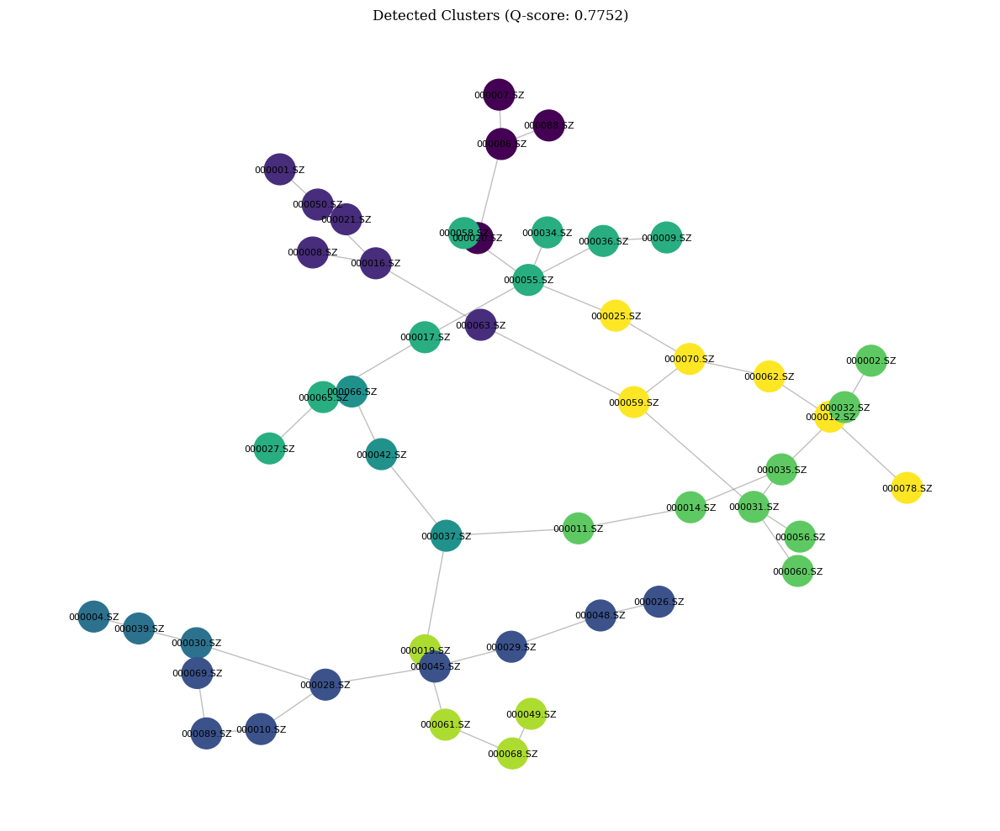

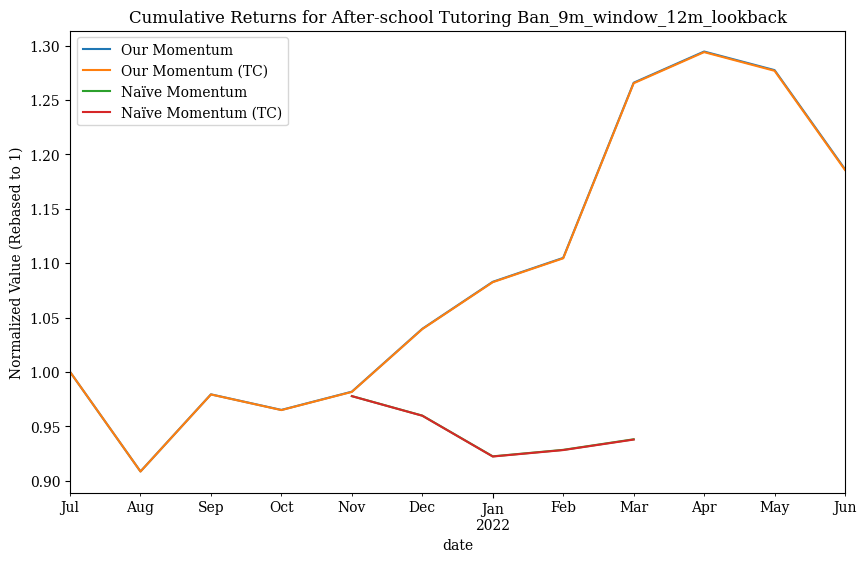

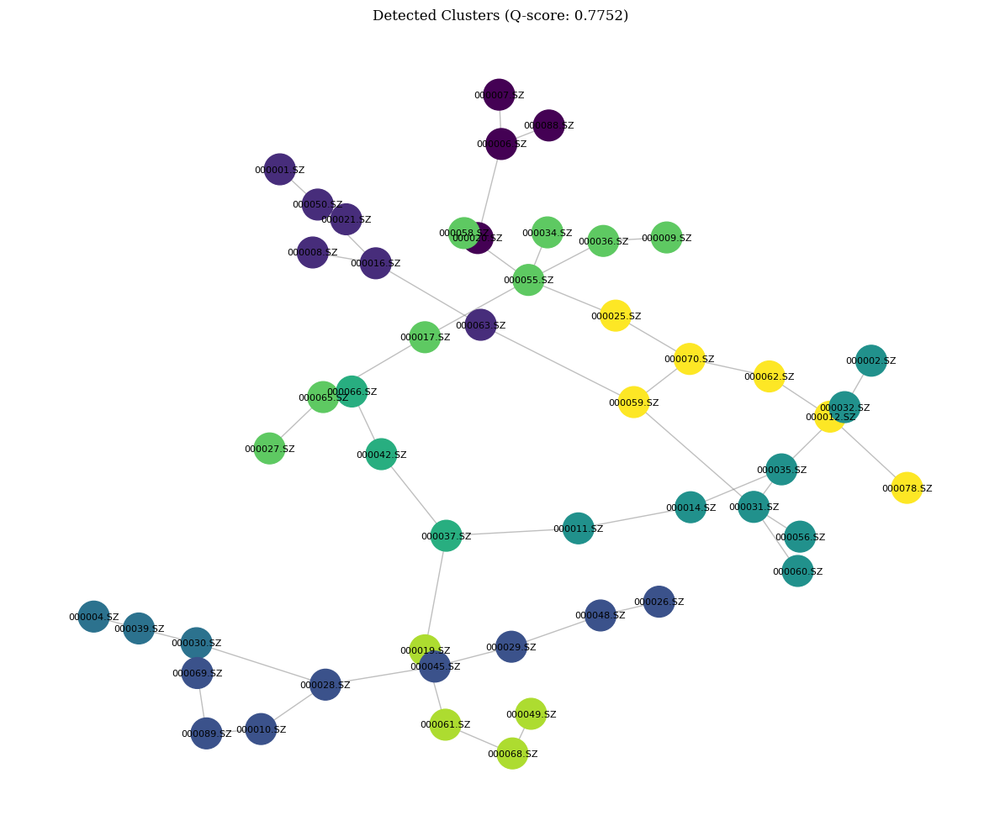

Plotting pnl started


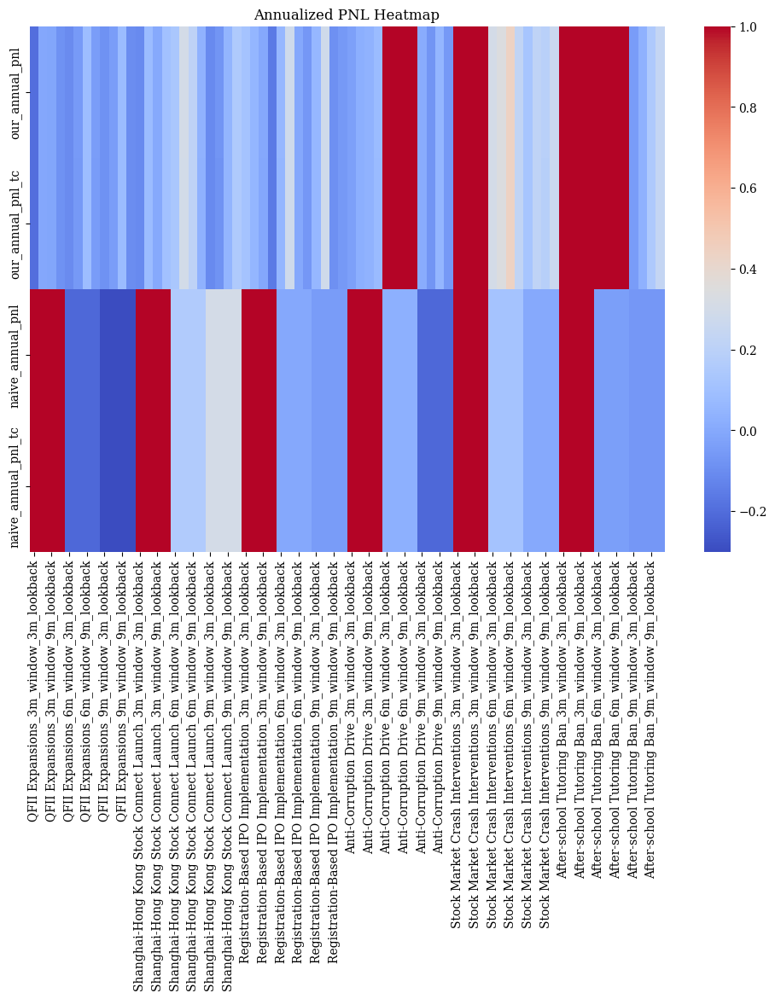

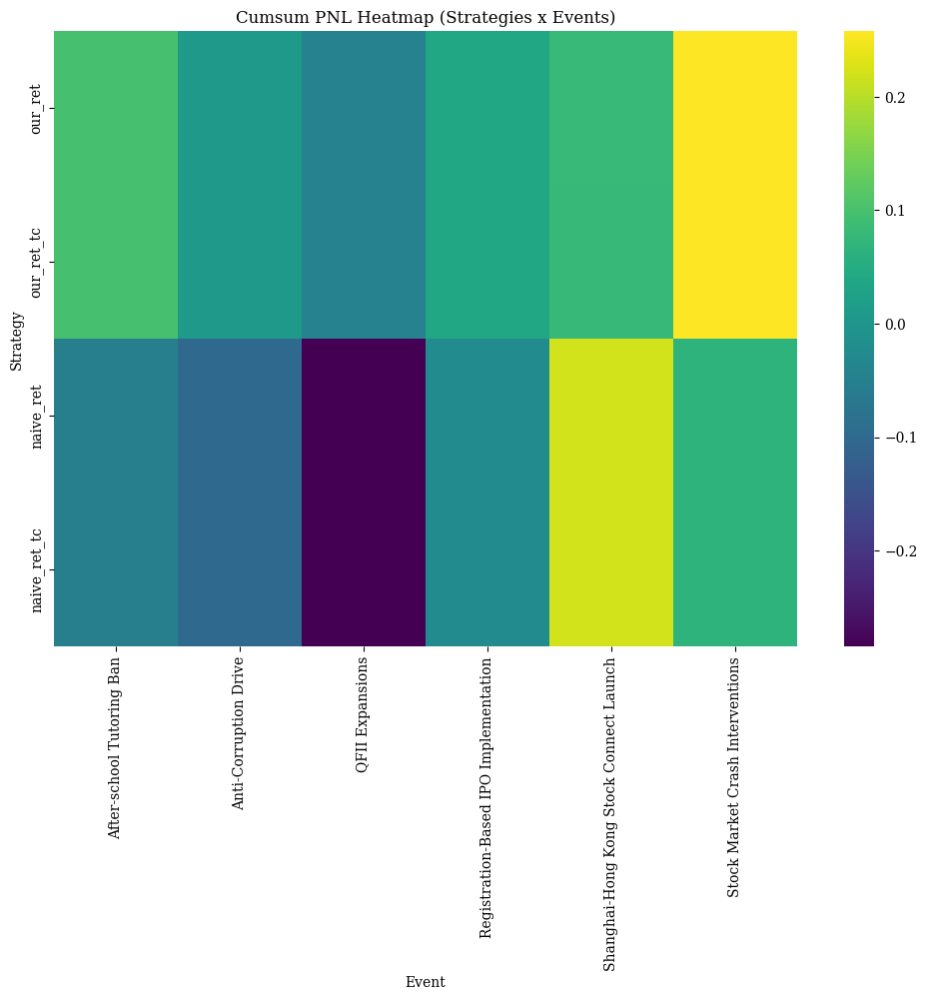

Plotting pnl finished


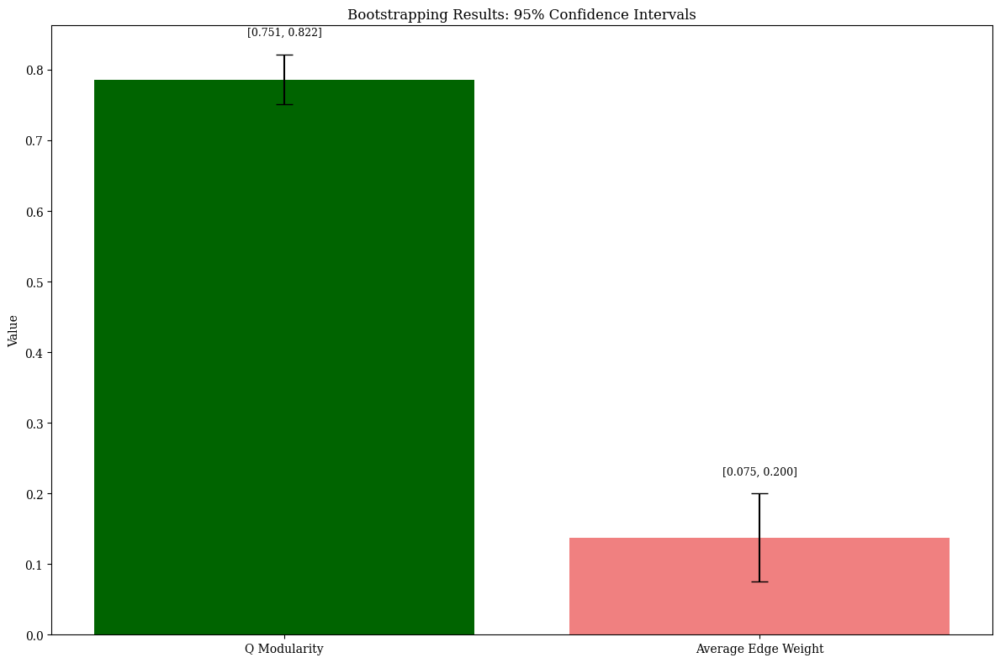

                                                   our_ret our_ret_tc  \
QFII Expansions_3m_window_3m_lookback            -0.210341  -0.210941   
QFII Expansions_3m_window_6m_lookback             0.003235   0.002635   
QFII Expansions_3m_window_9m_lookback             0.004796   0.004196   
QFII Expansions_3m_window_12m_lookback           -0.076401  -0.077001   
QFII Expansions_6m_window_3m_lookback            -0.098858  -0.099458   
...                                                    ...        ...   
After-school Tutoring Ban_6m_window_12m_lookback       NaN        NaN   
After-school Tutoring Ban_9m_window_3m_lookback  -0.039477  -0.040077   
After-school Tutoring Ban_9m_window_6m_lookback   0.039165   0.038565   
After-school Tutoring Ban_9m_window_9m_lookback   0.155448   0.154848   
After-school Tutoring Ban_9m_window_12m_lookback  0.235899   0.235299   

                                                 naive_ret naive_ret_tc  \
QFII Expansions_3m_window_3m_lookback           

In [32]:
import numpy as np

def detect_clusters(st):
    """Detects clusters using Louvain and computes modularity.

    Returns clusters and Q score.
    """
    if not st.edges():
        # If the graph has no edges, modularity is undefined or 0,
        # and each node forms its own community.
        communities = [{node} for node in st.nodes()] if st.nodes() else []
        Q = 0.0 # Assign 0.0 for graphs with no edges
        return communities, Q

    communities = nx.community.louvain_communities(st)
    partition = {node: i for i, comm in enumerate(communities) for node in comm}
    Q = nx.community.modularity(st, communities)
    return communities, Q

# Define events from Table 1
events = [
    {'Event': 'QFII Expansions', 'Date': '2013-01-01', 'Type': 'easing'},
    {'Event': 'Shanghai-Hong Kong Stock Connect Launch', 'Date': '2014-11-01', 'Type': 'easing'},
    {'Event': 'Registration-Based IPO Implementation', 'Date': '2023-02-01', 'Type': 'easing'},
    {'Event': 'Anti-Corruption Drive', 'Date': '2012-11-01', 'Type': 'tightening'},
    {'Event': 'Stock Market Crash Interventions', 'Date': '2015-07-01', 'Type': 'tightening'},
    {'Event': 'After-school Tutoring Ban', 'Date': '2021-07-01', 'Type': 'tightening'}
]

# Redeclare detect_clusters in case ZeroDivisionError.
import networkx as nx

def detect_clusters(st):
    """Detects clusters using Louvain and computes modularity.

    Returns clusters and Q score.
    """
    if not st.edges():
        # If the graph has no edges, modularity is undefined or 0,
        # and each node forms its own community.
        communities = [{node} for node in st.nodes()] if st.nodes() else []
        Q = 0.0 # Assign 0.0 for graphs with no edges
        return communities, Q

    communities = nx.community.louvain_communities(st)
    partition = {node: i for i, comm in enumerate(communities) for node in comm}
    Q = nx.community.modularity(st, communities)
    return communities, Q

import warnings
warnings.filterwarnings('ignore')

def main(file_path, events):

    returns_df, tp_df, vol_df = load_data(file_path)
    results = {}
    for event in events:
        date = pd.to_datetime(event['Date'])
        shock_type = event['Type']
        top_50 = select_top_vwap(tp_df, vol_df, date)
        for window_m in [3, 6, 9]:
            # Now compute_correlations uses 'date' as the event_date and calculates
            # correlations over a window *prior* to this date.
            corr, period_returns = compute_correlations(returns_df, top_50, date, window_months=window_m)
            tree_type = 'min' if shock_type == 'tightening' else 'max'
            st = build_spanning_trees(corr, tree_type)

            clusters, Q = detect_clusters(st)
            Q_ci, weight_ci = bootstrap_validation(period_returns, tree_type)
            for lookback in [3, 6, 9, 12]:
                port_ret = form_portfolios(returns_df, clusters, lookback, 12, date, shock_type)
                port_ret_tc = apply_tx_costs(port_ret)
                naive_ret = naive_momentum(returns_df, top_50, date, window_m)
                naive_ret_tc = apply_tx_costs(naive_ret)
                key = f"{event['Event']}_{window_m}m_window_{lookback}m_lookback"
                results[key] = {
                    'our_ret': port_ret.cumsum().iloc[-1] if not port_ret.empty else np.nan,
                    'our_ret_tc': port_ret_tc.cumsum().iloc[-1] if not port_ret_tc.empty else np.nan,
                    'naive_ret': naive_ret.cumsum().iloc[-1] if not naive_ret.empty else np.nan,
                    'naive_ret_tc': naive_ret_tc.cumsum().iloc[-1] if not naive_ret_tc.empty else np.nan,
                    'our_ret_series': port_ret, # Store the full series
                    'naive_ret_series': naive_ret, # Store the full series
                    'Q': Q,
                    'Q_ci_low': Q_ci[0],
                    'Q_ci_high': Q_ci[1],
                    'avg_weight_ci_low': weight_ci[0],
                    'avg_weight_ci_high': weight_ci[1],
                    'our_annual_pnl': calc_annual_pnl(port_ret, 12),
                    'our_annual_pnl_tc': calc_annual_pnl(port_ret_tc, 12),
                    'naive_annual_pnl': calc_annual_pnl(naive_ret, 12),
                    'naive_annual_pnl_tc': calc_annual_pnl(naive_ret_tc, 12)
                }
                plot_cumulative_returns(port_ret, port_ret_tc, naive_ret, naive_ret_tc, key, save_path=f'{key}.png')
                plot_clusters_detected(st, save_path='/content/clusters.png')

    result_df = pd.DataFrame(results).T
    print('Plotting pnl started')
    plot_annual_pnl(result_df)
    plot_cumsum_heatmap(result_df)
    print('Plotting pnl finished')
    plot_bootstrapping_results(Q_ci, weight_ci)
    # save result_df to csv
    result_df.to_csv('/content/result.csv')
    return result_df

# Run main
file_path = "/content/monthly_ohlcv.csv"
result_df2 = main(file_path, events)
print(result_df2)

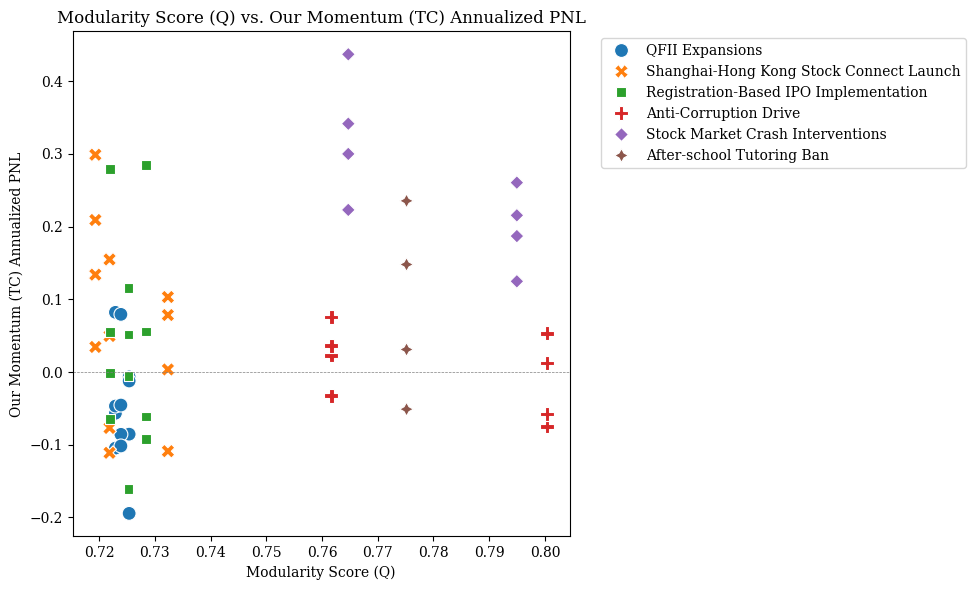

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create a scatter plot of Q score vs. Our Momentum (TC) Annual PNL
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Q', y='our_annual_pnl_tc', data=result_df2, hue='Event', style='Event', s=100)
plt.title('Modularity Score (Q) vs. Our Momentum (TC) Annualized PNL')
plt.xlabel('Modularity Score (Q)')
plt.ylabel('Our Momentum (TC) Annualized PNL')
plt.axhline(0, color='grey', linestyle='--', linewidth=0.5) # Add a horizontal line at 0 for reference
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.savefig('/content/modularity_vs_pnl.png')
plt.show()

Performing transaction cost sensitivity on the mean return across all events.
Transaction Cost Sensitivity Analysis (Mean of All Event Returns):
   Transaction Cost (bp)  Our Annual PNL (TC)  Naive Annual PNL (TC)
0                    1.0             0.426545              -0.162460
1                    6.0             0.406120              -0.168146
2                   11.0             0.385984              -0.173795
3                   16.0             0.366130              -0.179406
4                   21.0             0.346556              -0.184982


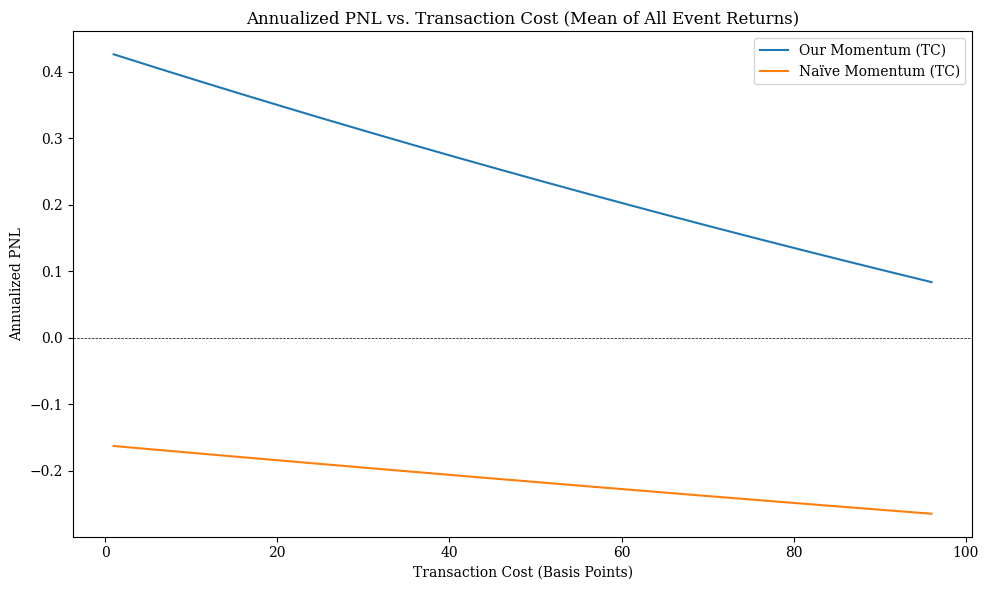

In [34]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Ensure result_df2 is available from the previous execution of main function
if 'result_df2' not in locals():
    print("Please run the main function first to generate result_df2.")
else:
    if not result_df2.empty:
        print("Performing transaction cost sensitivity on the mean return across all events.")

        # Extract all return series from the newly added 'our_ret_series' and 'naive_ret_series' columns
        all_raw_our_returns = [s for s in result_df2['our_ret_series'].dropna() if isinstance(s, pd.Series) and not s.empty]
        all_raw_naive_returns = [s for s in result_df2['naive_ret_series'].dropna() if isinstance(s, pd.Series) and not s.empty]

        if not all_raw_our_returns or not all_raw_naive_returns:
            print("No valid raw return series found in result_df2 for sensitivity analysis.")
        # Take mean of raw and naive ret
        # Concatenate all series and then group by date to get the average return for each date across all events/configurations
        mean_raw_our_returns_series = pd.concat(all_raw_our_returns).groupby(level=0).mean()
        mean_raw_naive_returns_series = pd.concat(all_raw_naive_returns).groupby(level=0).mean()

        """sensitivity execution"""
        # Define a range of transaction costs (from 1 basis point to 100 basis points)
        # 1bp = 0.0001, 100bp = 0.01
        tx_costs_bps = np.arange(1, 101, 5)  # From 1 to 100 bp, step by 5 bp
        tx_costs = tx_costs_bps / 10000.0

        sensitivity_results = []

        for tx_cost in tx_costs:
            # Apply transaction costs to the overall mean our momentum strategy returns
            our_ret_tc_sens = apply_tx_costs(mean_raw_our_returns_series, tx_cost=tx_cost)
            # Apply transaction costs to the overall mean naive momentum strategy returns
            naive_ret_tc_sens = apply_tx_costs(mean_raw_naive_returns_series, tx_cost=tx_cost)

            # Calculate annualized PNL for both with the current transaction cost
            # Take '12' months for annualization as per the main function
            our_annual_pnl_tc = calc_annual_pnl(our_ret_tc_sens, 12)
            naive_annual_pnl_tc = calc_annual_pnl(naive_ret_tc_sens, 12)

            sensitivity_results.append({
                'Transaction Cost (bp)': tx_cost * 10000,
                'Our Annual PNL (TC)': our_annual_pnl_tc,
                'Naive Annual PNL (TC)': naive_annual_pnl_tc
            })

        df_tx_sensitivity = pd.DataFrame(sensitivity_results)

        print("Transaction Cost Sensitivity Analysis (Mean of All Event Returns):")
        print(df_tx_sensitivity.head())

        # Plotting the sensitivity
        plt.figure(figsize=(10, 6))
        plt.plot(df_tx_sensitivity['Transaction Cost (bp)'], df_tx_sensitivity['Our Annual PNL (TC)'],
                 label='Our Momentum (TC)')
        plt.plot(df_tx_sensitivity['Transaction Cost (bp)'], df_tx_sensitivity['Naive Annual PNL (TC)'],
                 label='Naïve Momentum (TC)')
        plt.xlabel('Transaction Cost (Basis Points)')
        plt.ylabel('Annualized PNL')
        plt.title('Annualized PNL vs. Transaction Cost (Mean of All Event Returns)')
        plt.axhline(0, color='black', linestyle='--', linewidth=0.5)
        plt.legend()
        plt.tight_layout()
        plt.savefig('/content/tx_cost_sensitivity_mean_events.png')
        plt.show()

    else:
        print("result_df2 is empty. No data to perform sensitivity analysis.")